In [12]:
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import re
from sklearn.utils import class_weight

import pandas as pd
import os
import seaborn as sns
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import shutil

In [13]:
root_path = os.getcwd()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


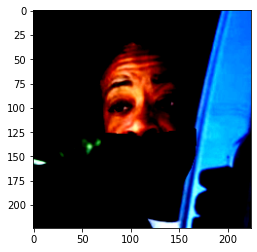

In [14]:
filename = root_path +"/LFW_Dataset/Masked_LFW_Dataset/Masked_LFW_Dataset/Al_Sharpton_0001.jpg"
input_image = Image.open(filename)

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)

plt.imshow(torch.swapaxes(torch.swapaxes(input_tensor, 0, 2), 0, 1))
plt.show()

### Data Loading

In [15]:
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision.datasets import ImageFolder

-----------------------------------------------------------------

**Comment:** to prevent data leakage, we will use same data splits used in the Task 1 (classifiers evaluation)

In [16]:
## Load dataset
train_test_settings = os.path.join(root_path, "split.parquet")
df_all = pd.read_parquet(train_test_settings)

In [17]:
dset_path = os.path.join(root_path, "LFW_Dataset/")

#### Prepare subset

#### Saving the different sub-datasets

CycleGAN models requires trainA, trainB folders to create two generators *from distribution A to distribution B* and vice-versa

In [18]:
save_path = root_path + "/pytorch-CycleGAN-and-pix2pix/datasets/LFW_dataset"

In [19]:
def create_subset(subset_name, df_frame, save_root):
    counter = 0
    try:
        new_folder = save_root + "/" + subset_name
        os.mkdir(new_folder)
    except:
        print("Already exist!")

    for index, row in df_frame.iterrows():
        path = row["fullpath"]
        splitted = path.split('/')
        target = os.path.join(save_root, subset_name, splitted[-1])

        shutil.copyfile(path, target)
        counter += 1
    print("\t {}: {}".format(subset_name, counter))

In [ ]:
subset = "trainA"  #Unmasked
create_subset(subset, trainA, save_path)

subset = "testA"
create_subset(subset, testA, save_path)

subset = "trainB"   #Masked
create_subset(subset, trainB, save_path)

subset = "testB"
create_subset(subset, testB, save_path)

### Loading subsets

In [20]:
dset_path = os.path.join(root_path, "LFW_Dataset/")

## Results from CycleGAN
cycle_gan_folder = "pytorch-CycleGAN-and-pix2pix"
dataset = "LFW Dataset"
model_trained = "mask2unmask_final2"

trainA_path = os.path.join(root_path, cycle_gan_folder, "datasets", "LFW_dataset", "trainA")
trainB_path = os.path.join(root_path, cycle_gan_folder, "datasets", "LFW_dataset", "trainB")

testA_path = os.path.join(root_path, cycle_gan_folder, "datasets", "LFW_dataset", "testA")
testB_path = os.path.join(root_path, cycle_gan_folder, "datasets", "LFW_dataset", "testB")

In [21]:
def extract_files(folder_path):
    paths = []
    for root, dirs, files in os.walk(folder_path, topdown=False):
        for name in files:
            paths.append((root, name))
    return paths
    
def create_df_from_real(paths):
    df = pd.DataFrame(paths, columns=['root', 'filename'])
    
    df['fullpath'] = df['root'] + '/' + df['filename']
    df = df.drop(columns="root")
    df['person'] = df['filename'].apply(lambda x: " ".join(x.split("_")[:-1]))
    
    df["name"] = df["filename"].apply(lambda x: "_".join(x.split("_")[:-1]))
    
    return df

def create_df(paths):
    df = pd.DataFrame(paths, columns=['root', 'filename'])
    
    df['fullpath'] = df['root'] + '/' + df['filename']
    df = df.drop(columns="root")
    df["fake"]   = False
    df['person'] = df['filename'].apply(lambda x: " ".join(x.split("_")[:-2]))
    
    df['status'] = df['filename'].apply(lambda x: x.split("_")[-1][:-4])
    df["name"] = df["filename"].apply(lambda x: "_".join(x.split("_")[:-1]))
    df['fake'].loc[df['status'] == 'fake'] = True
    df = df.drop(columns="status")
    
    fake_df = df[df['fake']]
    fake_df = fake_df.drop(columns="fake")
    
    real_df = df[~df['fake']]
    real_df = real_df.drop(columns="fake")
    
    return real_df, fake_df

In [22]:
#Getting results from CycleGAN

trainA_urls = extract_files(trainA_path)
trainB_urls = extract_files(trainA_path)

testA_urls = extract_files(testA_path)
testB_urls = extract_files(testB_path)

In [23]:
trainA  = create_df_from_real(trainA_urls)
trainB  = create_df_from_real(trainB_urls)

testA  = create_df_from_real(testA_urls)
testB  = create_df_from_real(testB_urls)

In [24]:
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [25]:
from torch.utils.data import Dataset
from torchvision.io import read_image


data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224, scale=(.5, 1.)),
        transforms.AutoAugment(transforms.AutoAugmentPolicy.IMAGENET),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

class PandasDataset(Dataset):
    def __init__(self, df: pd.DataFrame, transform=None, target_transform=None,
                 path_col = 'fullpath', label_col = 'person'):
        self.df = df.copy()
        self.img_paths = df[path_col]
        self.labels = df[label_col]
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        path = self.img_paths.iloc[idx]
        image = Image.open(path)
        label = self.labels.iloc[idx]


        if self.transform:
            image = self.transform(image)

        if self.target_transform:
            label = self.target_transform(label)

        return image, label

def tokenize_names(name: str):
    return name_to_idx[name]

In [26]:
import json

current_path = os.getcwd()
tokenz_path = os.path.join(current_path, "tokens.json")
f = open(tokenz_path)
name_to_idx = json.load(f)

In [27]:
from tqdm import tqdm

def test_accuracy(dl_, model):
    match = 0
    with torch.no_grad():
        for input, label in tqdm(dl_):
            input = input.cuda()
            out = model(input)
            pred_y = torch.argmax(out, dim=-1).cpu()
            match += torch.sum(pred_y == label)

    n_ = len(dl_.dataset)
    print('\n\tNumber of matches: {}, Number of samples: {}, Accuracy: {:.4f}'.format(match, n_, match/n_))

### Evaluation Classifier on Fake Data

>- General Model: trained on both masked and naked faces

In [28]:
type_model = "imad_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

In [29]:
## Results from CycleGAN
cycle_gan_folder = "pytorch-CycleGAN-and-pix2pix"
dataset = "LFW Dataset"
model_trained = "mask2unmask_final2"

fake_naked_path = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "fake_naked")
fake_masked_path = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "fake_masked")

In [30]:
#Getting results from CycleGAN

fake_naked = extract_files(fake_naked_path)[:-1]
fake_masked = extract_files(fake_masked_path)[:-1]

In [31]:
fake_naked_real, fake_naked_fake = create_df(fake_naked)
fake_masked_real, fake_masked_fake = create_df(fake_masked)

/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [32]:
#Naked Fake dataloader
ds_fake_naked_fake = PandasDataset(fake_naked_fake, transform=data_transforms["val"], target_transform=tokenize_names)
dl_fake_naked_fake = torch.utils.data.DataLoader(ds_fake_naked_fake, batch_size=32, shuffle=False, num_workers=4)

#Masked Fake dataloader
ds_fake_masked_fake = PandasDataset(fake_masked_fake, transform=data_transforms["val"], target_transform=tokenize_names)
dl_fake_masked_fake = torch.utils.data.DataLoader(ds_fake_masked_fake, batch_size=32, shuffle=False, num_workers=4)

In [33]:
# Dataloader for General classifier (Both Masked/Fake)
frames = [fake_naked_fake, fake_masked_fake]
both_dfs = pd.concat(frames)

ds_both_dfs = PandasDataset(both_dfs, transform=data_transforms["val"], target_transform=tokenize_names)
dl_both_dfs = torch.utils.data.DataLoader(ds_both_dfs, batch_size=32, shuffle=False, num_workers=4)

----------------------------------------------------------------------------------------

#### Fake Data: Generated from testA/testB using CycleGAN

In [75]:
#Naked Fake
test_accuracy(dl_fake_naked_fake, model)

100%|██████████| 16/16 [00:01<00:00, 14.53it/s]


	Number of matches: 227, Number of samples: 500, Accuracy: 0.4540


In [76]:
#Masked Fake
test_accuracy(dl_fake_masked_fake, model)

100%|██████████| 16/16 [00:01<00:00, 14.71it/s]


	Number of matches: 230, Number of samples: 500, Accuracy: 0.4600


In [77]:
test_accuracy(dl_both_dfs, model)

100%|██████████| 32/32 [00:01<00:00, 19.08it/s]


	Number of matches: 457, Number of samples: 1000, Accuracy: 0.4570


------------------------------------------------ 

In [78]:
type_model = "imad_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

In [79]:
#Naked Fake
test_accuracy(dl_fake_naked_fake, model)

100%|██████████| 16/16 [00:01<00:00, 10.12it/s]


	Number of matches: 166, Number of samples: 500, Accuracy: 0.3320


In [80]:
#Masked Fake
test_accuracy(dl_fake_masked_fake, model)

100%|██████████| 16/16 [00:01<00:00, 10.58it/s]


	Number of matches: 159, Number of samples: 500, Accuracy: 0.3180


In [81]:
test_accuracy(dl_both_dfs, model)

100%|██████████| 32/32 [00:02<00:00, 12.52it/s]


	Number of matches: 325, Number of samples: 1000, Accuracy: 0.3250


--------------------------------------------------------------------------------------------

### from Masked to Naked

In [82]:
type_model = "imad_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "naked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

#Naked Fake
test_accuracy(dl_fake_naked_fake, model)

100%|██████████| 16/16 [00:01<00:00, 14.03it/s]


	Number of matches: 161, Number of samples: 500, Accuracy: 0.3220


In [83]:
#Naked Real dataloader
ds_naked = PandasDataset(testA, transform=data_transforms["val"], target_transform=tokenize_names)
dl_naked = torch.utils.data.DataLoader(ds_naked, batch_size=32, shuffle=False, num_workers=4)

#Naked Real
test_accuracy(dl_naked, model)

100%|██████████| 27/27 [00:02<00:00, 13.10it/s]


	Number of matches: 391, Number of samples: 846, Accuracy: 0.4622


In [84]:
type_model = "imad_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "naked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

#Naked Fake
test_accuracy(dl_fake_naked_fake, model)

100%|██████████| 16/16 [00:01<00:00, 10.46it/s]


	Number of matches: 134, Number of samples: 500, Accuracy: 0.2680


In [85]:
#Naked Real dataloader
ds_naked = PandasDataset(testA, transform=data_transforms["val"], target_transform=tokenize_names)
dl_naked = torch.utils.data.DataLoader(ds_naked, batch_size=32, shuffle=False, num_workers=4)

#Naked Real
test_accuracy(dl_naked, model)

100%|██████████| 27/27 [00:02<00:00, 11.42it/s]


	Number of matches: 273, Number of samples: 846, Accuracy: 0.3227


In [ ]:
fake_naked_real

In [101]:
def vis_df_results(columns,  output_gan, input_gan, real_data, rand = []):
    fig, ax = plt.subplots(3, columns, figsize = (25, 15))
    
    # Calling merge() function
    int_df = pd.merge(output_gan, real_data, how ='inner', on =['name'])
    df = pd.merge(int_df, input_gan, how ='inner', on =['name'])
    
    for col in range(columns):
        rand = random[col]
        
        output_gan_path = df["fullpath_y"][rand]
        input_gan_path = df["fullpath"][rand]
        real_data_path = df["fullpath_x"][rand]
        
        fake_img, input_img = Image.open(output_gan_path), Image.open(input_gan_path)
        real_img = Image.open(real_data_path)
        
        ax[0][col].imshow(fake_img)
        ax[1][col].imshow(input_img)
        ax[2][col].imshow(real_img)

        ax[0][col].axes.get_xaxis().set_visible(False)
        ax[1][col].axes.get_xaxis().set_visible(False)
        ax[2][col].axes.get_xaxis().set_visible(False)

        ax[0][col].axes.get_yaxis().set_visible(True)
        ax[1][col].axes.get_yaxis().set_visible(True)
        ax[2][col].axes.get_yaxis().set_visible(True)

        ax[0][col].set_aspect('equal')
        ax[1][col].set_aspect('equal')
        ax[2][col].set_aspect('equal')

        ax[0][col].set_xticklabels([])
        ax[0][col].set_yticklabels([])

        ax[1][col].set_xticklabels([])
        ax[1][col].set_yticklabels([])
        
        ax[2][col].set_xticklabels([])
        ax[2][col].set_yticklabels([])

        ax[0][0].set_ylabel("Real", fontsize = 16)
        ax[1][0].set_ylabel("Input", fontsize = 16)
        ax[2][0].set_ylabel("Fake", fontsize = 16)

    plt.subplots_adjust(wspace=0.1, hspace=-0.55)
        

In [102]:
import numpy as np

n_samples = 7
max_samples = 300

random = np.random.randint(low = 1, high = max_samples, size = n_samples)

In [ ]:
vis_df_results(n_samples,  output_gan = fake_naked_fake, input_gan = fake_naked_real, real_data = trainA, rand = random)

----------------------------------------------------------------------------------------------

### from Naked to Masked

In [104]:
type_model = "imad_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "masked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, s, o  = torch.load(model_path)

In [105]:
#Masked Fake
test_accuracy(dl_fake_masked_fake, model)

100%|██████████| 16/16 [00:01<00:00, 13.91it/s]


	Number of matches: 103, Number of samples: 500, Accuracy: 0.2060


In [106]:
#Masked Real dataloader
ds_masked = PandasDataset(testB, transform=data_transforms["val"], target_transform=tokenize_names)
dl_masked = torch.utils.data.DataLoader(ds_masked, batch_size=32, shuffle=False, num_workers=4)

#Masked Real
test_accuracy(dl_masked, model)

100%|██████████| 25/25 [00:01<00:00, 12.63it/s]


	Number of matches: 225, Number of samples: 800, Accuracy: 0.2812


In [107]:
type_model = "imad_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "masked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, s, o  = torch.load(model_path)

In [108]:
#Masked Fake
test_accuracy(dl_fake_masked_fake, model.cuda(0))

100%|██████████| 16/16 [00:01<00:00, 10.01it/s]


	Number of matches: 99, Number of samples: 500, Accuracy: 0.1980


In [109]:
#Masked Real dataloader
ds_masked = PandasDataset(testB, transform=data_transforms["val"], target_transform=tokenize_names)
dl_masked = torch.utils.data.DataLoader(ds_masked, batch_size=32, shuffle=False, num_workers=4)

#Masked Real
test_accuracy(dl_masked, model)

100%|██████████| 25/25 [00:02<00:00, 10.80it/s]


	Number of matches: 181, Number of samples: 800, Accuracy: 0.2262


In [781]:
# mask2unmask, unmask2mask
target_dset = unmask2mask

n_samples = 7
max_samples = 300

random = np.random.randint(low = 1, high = max_samples, size = n_samples)

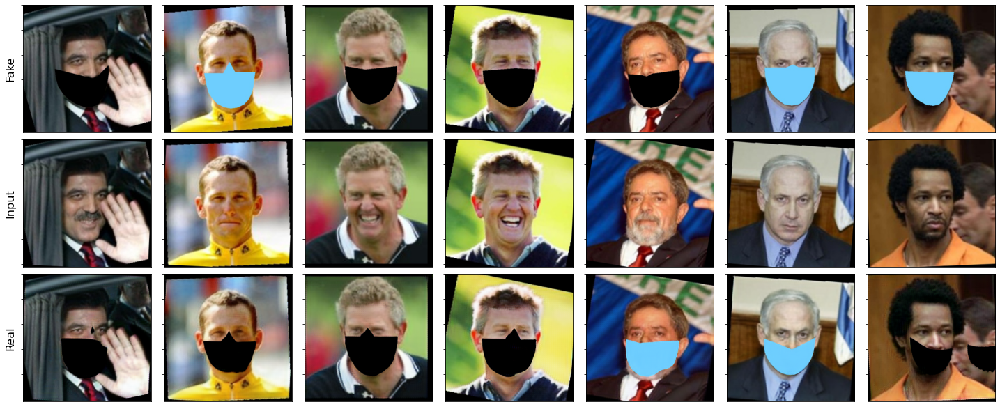

In [782]:
vis_df_results(n_samples,  output_gan = mask2unmask_fake, input_gan = mask2unmask_real, real_data = unmask2mask_real, rand = random)

----------------------------------------------------------------------

### Heatmaps Visualization

We would like to visualize the heatmaps of our ResNet18 classifier using Gram-CAM technique


In [34]:
import json
current_path = os.getcwd()
tokenz_path = os.path.join(current_path, "tokens.json")
f = open(tokenz_path)
name_to_idx = json.load(f)

In [35]:
!pip install grad-cam

In [36]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50

In [37]:
from PIL import Image

def vis_gra_cam(model, input_tensor, target_layers, use_cuda = True, nbr_classes = 422):

    # Construct the CAM object once, and then re-use it on many images:
    cam = GradCAM(model=model, target_layers=target_layers, use_cuda=use_cuda)

    # You can also use it within a with statement, to make sure it is freed,
    # In case you need to re-create it inside an outer loop:
    # with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
    #   ...

    # If target_category is None, the highest scoring category
    # will be used for every image in the batch.
    # target_category can also be an integer, or a list of different integers
    # for every image in the batch.
    target_category = None

    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    grayscale_cam = cam(input_tensor=input_tensor, target_category=target_category, aug_smooth=True, eigen_smooth=True)

    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = grayscale_cam[0, :]
    rgb_img = torch.swapaxes(torch.swapaxes(input_tensor, 1, 2), 2, 3)
    
    rgb_img = Image.fromarray(rgb_img[0].cpu().numpy().astype(np.uint8))
    #rgb_img = rgb_img / 255
    rgb_img = np.array(rgb_img)
    rgb_img = rgb_img.astype(np.float32)
    rgb_img = rgb_img / 255
    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
    
    return visualization

In [38]:
def plot_cams(input_tensor, labels, model1, preds_y, model2, preds_y2, samples = 5):
    fig, ax = plt.subplots(3, samples, figsize = (15, 10))

    for i in range(samples):
        sample = torch.swapaxes(torch.swapaxes(input_tensor[i], 0, 1), 1, 2).cpu().numpy()
        
        # list out keys and values separately
        key_list = list(name_to_idx.keys())
        val_list = list(name_to_idx.values())
        
        name_celeb = val_list.index(labels[i].numpy())
        ax[0][i].set_title(key_list[name_celeb])
        ax[0][i].imshow(sample)

        #Smoothing is activated

        output = vis_gra_cam(model1, input_tensor[i].unsqueeze(0), use_cuda = True, nbr_classes = len(key_list), target_layers = [model.layer4[-1]])
        output2 = vis_gra_cam(model2, input_tensor[i].unsqueeze(0), use_cuda = True, nbr_classes = len(key_list), target_layers = [model2.features[-1]])
        
        name_celeb = val_list.index(preds_y[i].numpy())
        name_celeb2 = val_list.index(preds_y2[i].numpy())
        
        plt.setp(ax[0][i].get_xticklabels(), visible=False)
        plt.setp(ax[0][i].get_yticklabels(), visible=False)
        ax[0][i].tick_params(axis='both', which='both', length=0)
        
        plt.setp(ax[1][i].get_xticklabels(), visible=False)
        plt.setp(ax[1][i].get_yticklabels(), visible=False)
        ax[1][i].tick_params(axis='both', which='both', length=0)
        
        plt.setp(ax[2][i].get_xticklabels(), visible=False)
        plt.setp(ax[2][i].get_yticklabels(), visible=False)
        ax[2][i].tick_params(axis='both', which='both', length=0)
        
        ax[1][i].set_title(key_list[name_celeb])
        ax[1][0].set_ylabel("ResNet18")
        ax[1][i].imshow(output)
        
        ax[2][i].set_title(key_list[name_celeb2])
        ax[2][0].set_ylabel("VGG16")
        ax[2][i].imshow(output2)
        
    plt.subplots_adjust(wspace=0.1, hspace=-0.10)

> - General Model: Model trained on both Naked/Masked faces

In [59]:
type_model = "imad_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

type_model = "imad_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "general.pt"
model_path = os.path.join(dir_pretrained, model_name)

model2, scores, history = torch.load(model_path)

In [60]:
# Naked Fake
samples = 5

model = model.cuda()

def return_good_examples(target_set, model):
    resnet_well, resnet_well_labels = [], []
    resnet_bad, resnet_bad_labels = [], []
    
    with torch.no_grad():
        for batch, labels in target_set:
            inputs = batch.cuda()
            preds = model(inputs)
            pred_y = torch.argmax(preds, dim=1).cpu()
            correct_resnet = (pred_y == labels.data)
            
            
            for index, elem in enumerate(correct_resnet):
                if elem == True:
                    resnet_well.append(inputs[index])
                    resnet_well_labels.append(labels[index])
                else:
                    resnet_bad.append(inputs[index])
                    resnet_bad_labels.append(labels[index])
                    
            return resnet_well, resnet_well_labels, resnet_bad, resnet_bad_labels

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


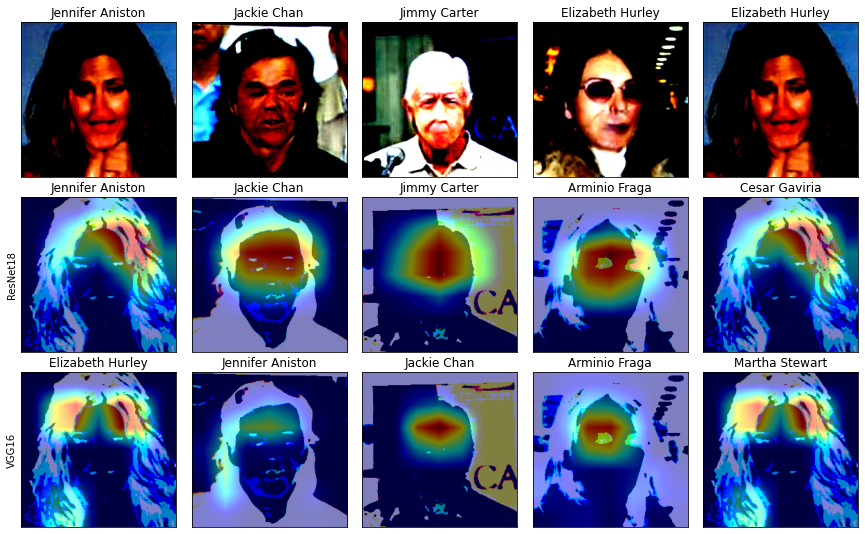

In [61]:
import numpy as np

target_set = dl_fake_naked_fake

gd, gd_labels, bad, bad_labels = return_good_examples(target_set, model)  #ResNet
gd_vgg, gd_labels_vgg, bad_vgg, bad_labels_vgg = return_good_examples(target_set, model2)  #VGG

input_tensor = [gd[0], gd[1], gd[2], gd_vgg[0], gd_vgg[1]]
output_labels = [gd_labels[0], gd_labels[1], gd_labels[2], gd_labels_vgg[0], gd_labels_vgg[0]]
preds_y = gd_labels[:5]
preds_y2 = gd_labels_vgg[:5]

plot_cams(input_tensor, output_labels, model, preds_y, model2, preds_y2, samples = 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


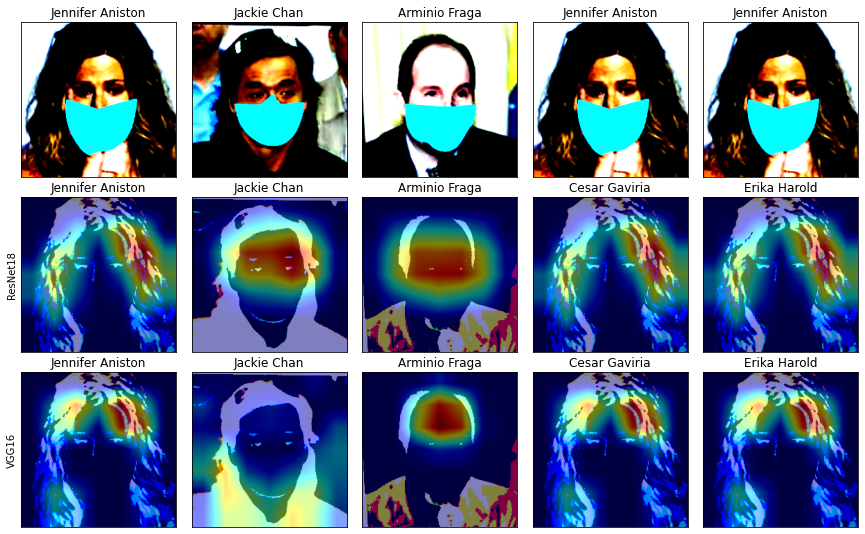

In [62]:
target_set = dl_fake_masked_fake

gd, gd_labels, bad, bad_labels = return_good_examples(target_set, model)  #ResNet
gd_vgg, gd_labels_vgg, bad_vgg, bad_labels_vgg = return_good_examples(target_set, model2)  #VGG

input_tensor = [gd[0], gd[1], gd[2], gd_vgg[0], gd_vgg[0]]
output_labels = [gd_labels[0], gd_labels[1], gd_labels[2], gd_labels_vgg[0], gd_labels_vgg[0]]
preds_y = gd_labels[:5]
preds_y2 = gd_labels_vgg[:5]

plot_cams(input_tensor, output_labels, model, preds_y, model2, preds_y2, samples = 5)

---------------------------------------------------------------------------------------

> - Masked Model: Model trained on Masked faces

In [63]:
torch.cuda.empty_cache()

In [64]:
type_model = "imad_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "masked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

type_model = "imad_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "masked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model2, scores, history = torch.load(model_path)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


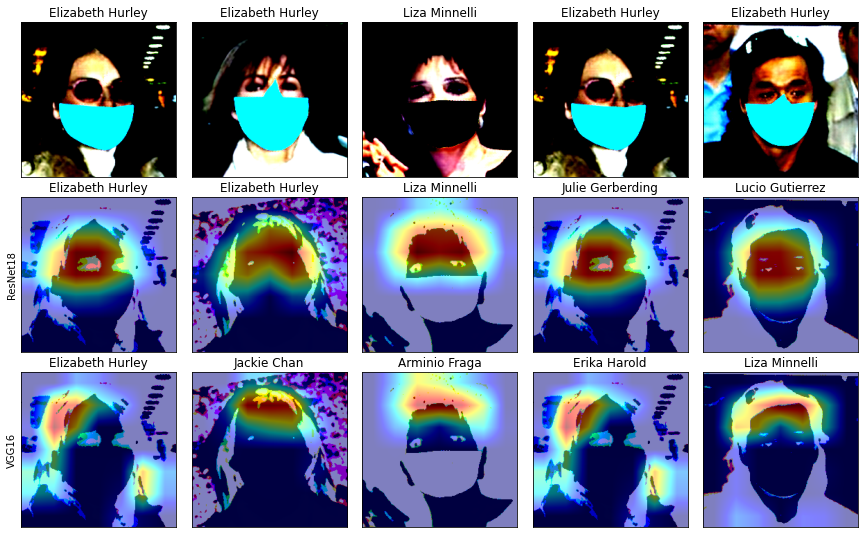

In [65]:
import numpy as np

target_set = dl_fake_masked_fake

gd, gd_labels, bad, bad_labels = return_good_examples(target_set, model.cuda(0))  #ResNet
gd_vgg, gd_labels_vgg, bad_vgg, bad_labels_vgg = return_good_examples(target_set, model2.cuda(0))  #VGG

input_tensor = [gd[0], gd[1], gd[2], gd_vgg[0], gd_vgg[1]]
output_labels = [gd_labels[0], gd_labels[1], gd_labels[2], gd_labels_vgg[0], gd_labels_vgg[0]]
preds_y = gd_labels[:5]
preds_y2 = gd_labels_vgg[:5]

plot_cams(input_tensor, output_labels, model.cuda(0), preds_y, model2.cuda(0), preds_y2, samples = 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


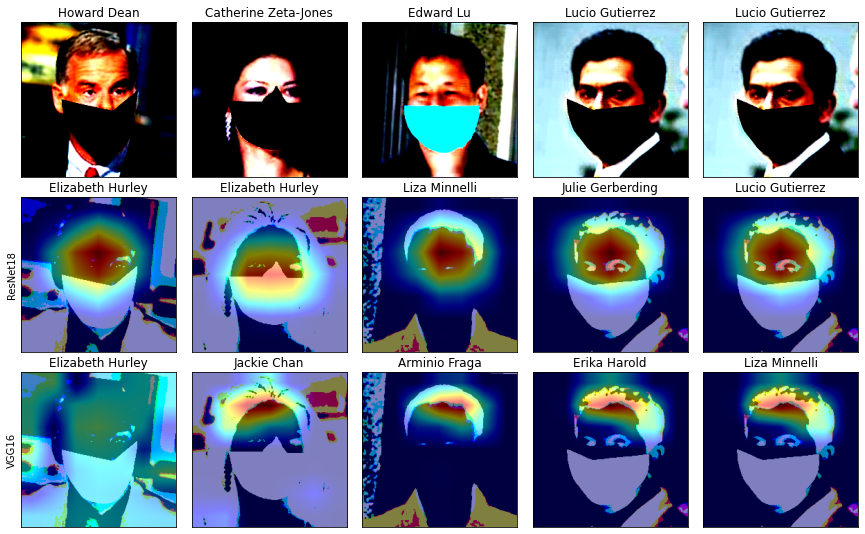

In [66]:
i = 5

gd, gd_labels, bad, bad_labels = return_good_examples(target_set, model.cuda(0))  #ResNet
gd_vgg, gd_labels_vgg, bad_vgg, bad_labels_vgg = return_good_examples(target_set, model2.cuda(0))  #VGG

input_tensor = [gd[i+0], gd[i+1], gd[i+2], gd_vgg[i+0], gd_vgg[i+0]]
output_labels = [gd_labels[i+0], gd_labels[i+1], gd_labels[i+2], gd_labels_vgg[i+0], gd_labels_vgg[i+0]]
preds_y = gd_labels[:i+5]
preds_y2 = gd_labels_vgg[:i+5]

plot_cams(input_tensor, output_labels, model.cuda(0), preds_y, model2.cuda(0), preds_y2, samples = 5)

> - Naked Model: Model trained on naked faces

In [67]:
type_model = "imad_resnet_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "naked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model, scores, history = torch.load(model_path)

type_model = "new_vgg_"
### Load Model
dir_pretrained = os.path.join(root_path, "pretrained")
model_name = type_model + "naked.pt"
model_path = os.path.join(dir_pretrained, model_name)

model2, scores, history = torch.load(model_path)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


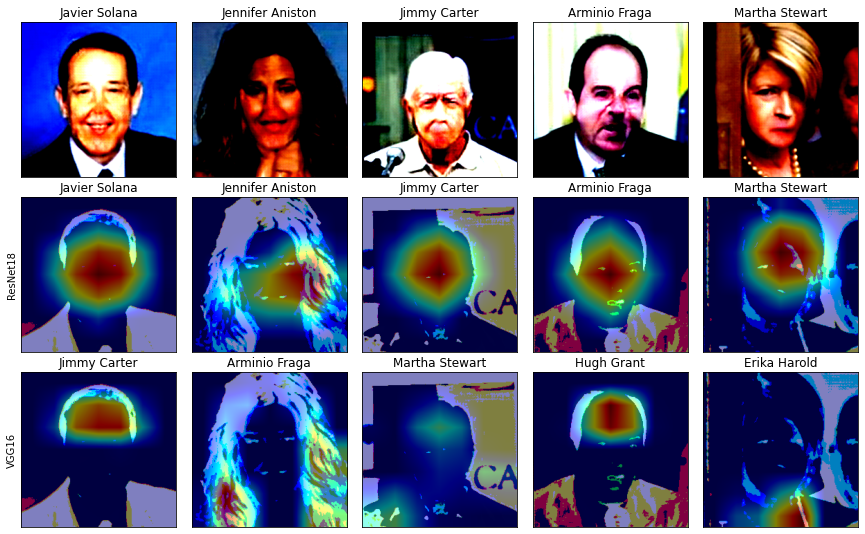

In [80]:
i = 0

target_set = dl_fake_naked_fake

gd, gd_labels, bad, bad_labels = return_good_examples(target_set, model.cuda(0))  #ResNet
gd_vgg, gd_labels_vgg, bad_vgg, bad_labels_vgg = return_good_examples(target_set, model2.cuda(0))  #VGG

input_tensor = [gd[i+0], gd[i+1], gd[i+2], gd[i+3], gd[i+4]]
output_labels = [gd_labels[i+0], gd_labels[i+1], gd_labels[i+2], gd_labels[i+3], gd_labels[i+4]]
preds_y = gd_labels[:i+5]
preds_y2 = gd_labels[2:i+5+2]

plot_cams(input_tensor, output_labels, model.cuda(0), preds_y, model2.cuda(0), preds_y2, samples = 5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


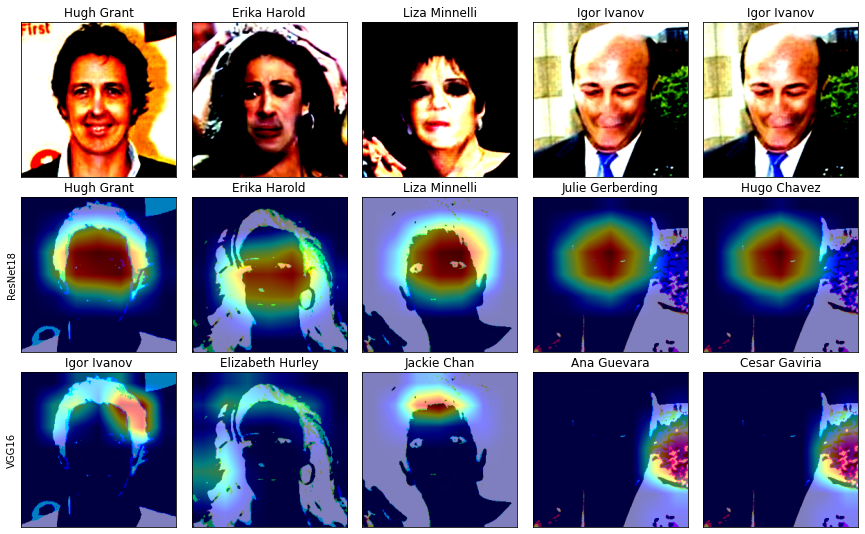

In [83]:
i = 5
target_set = dl_fake_naked_fake

gd, gd_labels, bad, bad_labels = return_good_examples(target_set, model.cuda(0))  #ResNet
gd_vgg, gd_labels_vgg, bad_vgg, bad_labels_vgg = return_good_examples(target_set, model2.cuda(0))  #VGG

input_tensor = [gd[i+0], gd[i+1], gd[i+2], bad[i+0], bad[i+0]]
output_labels = [gd_labels[i+0], gd_labels[i+1], gd_labels[i+2], bad_labels[i+0], bad_labels[i+0]]
preds_y = gd_labels[i:i+5]
preds_y2 = bad_labels[i:i+5]

plot_cams(input_tensor, output_labels, model.cuda(0), preds_y, model2.cuda(0), preds_y2, samples = 5)

------------------------------------------------------------------------------------

### Evaluating differences Real/Fake

In [353]:
## Results from CycleGAN
cycle_gan_folder = "pytorch-CycleGAN-and-pix2pix"
dataset = "LFW Dataset"
model_trained = "mask2unmask_final2"
masked_to_unmasked = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "test_latest_Masked_toUnmasked")
unmasked_to_masked = os.path.join(root_path, cycle_gan_folder, "results", model_trained, "test_latest_Unmasked_toMasked")

In [354]:
#Getting results from CycleGAN

mask2unmask = extract_files(masked_to_unmasked)[:-1]
unmask2mask = extract_files(unmasked_to_masked)[:-1]

In [356]:
mask2unmask_real, mask2unmask_fake = create_df(mask2unmask)
unmask2mask_real, unmask2mask_fake = create_df(unmask2mask)

/home/imad/anaconda3/envs/inf664/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [358]:
def calculateDistance(i1, i2):
    assert len(i1.shape) == len(i2.shape)
    return ((i1-i2)**2).mean()

In [361]:
def vis_diff(fake_cyclegan, real, samples):
    rows, columns = 3, samples
    fig, ax = plt.subplots(rows, columns, figsize = (25, 15))
    
    # Calling merge() function
    df = pd.merge(fake_cyclegan, real, how ='inner', on =['name'])

    for col in range(columns):
        rand = random[col]
        
        output_gan_path = df["fullpath_y"][rand]
        input_gan_path = df["fullpath_x"][rand]
        
        fake_img, input_img = Image.open(output_gan_path), Image.open(input_gan_path)
        error = calculateDistance(np.array(fake_img), np.array(input_img))
        diff = np.array(fake_img) - np.array(input_img)
        
        ax[0][col].imshow(fake_img)
        ax[1][col].imshow(input_img)
        ax[2][col].imshow(diff)

        ax[0][col].axes.get_xaxis().set_visible(False)
        ax[1][col].axes.get_xaxis().set_visible(False)
        ax[2][col].axes.get_xaxis().set_visible(False)

        ax[0][col].axes.get_yaxis().set_visible(True)
        ax[1][col].axes.get_yaxis().set_visible(True)
        ax[2][col].axes.get_yaxis().set_visible(True)

        ax[0][col].set_aspect('equal')
        ax[1][col].set_aspect('equal')
        ax[2][col].set_aspect('equal')

        ax[0][col].set_xticklabels([])
        ax[0][col].set_yticklabels([])

        ax[1][col].set_xticklabels([])
        ax[1][col].set_yticklabels([])
        
        ax[2][col].set_xticklabels([])
        ax[2][col].set_yticklabels([])

        ax[0][0].set_ylabel("Fake", fontsize = 16)
        ax[1][0].set_ylabel("Real", fontsize = 16)
        ax[2][0].set_ylabel("Difference", fontsize = 16)
        ax[2][col].set_title("L2 Distance: {}".format(round(error, 5)))
        
    plt.subplots_adjust(wspace=0.1, hspace=-0.45)

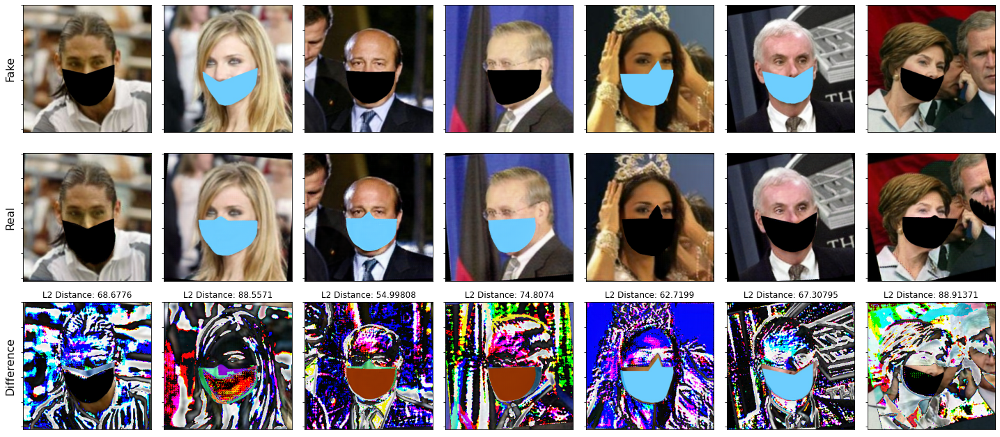

In [362]:
# mask2unmask, unmask2mask
target_dset = unmask2mask
n_samples = 7
random = np.random.randint(low = 1, high = 400, size = n_samples)

vis_diff(mask2unmask_fake, unmask2mask_real, n_samples)

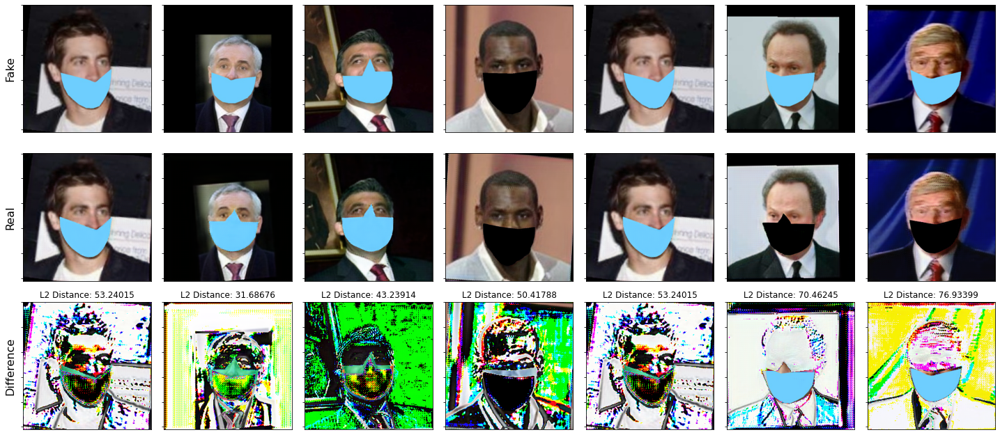

In [363]:
# mask2unmask, unmask2mask
target_dset = unmask2mask
n_samples = 7
random = np.random.randint(low = 1, high = 400, size = n_samples)

vis_diff(mask2unmask_fake, unmask2mask_real, n_samples)

----------------------------------------------------------------------------------------

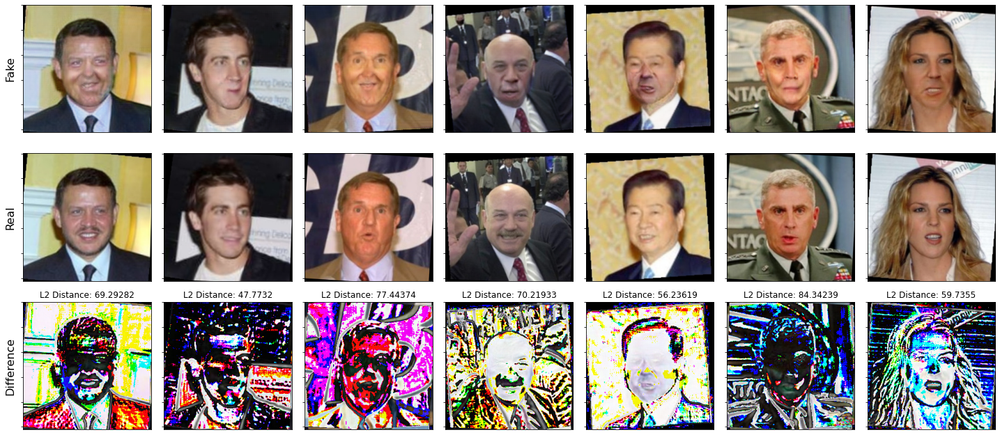

In [666]:
# mask2unmask, unmask2mask
target_dset = unmask2mask
n_samples = 7
random = np.random.randint(low = 1, high = 400, size = n_samples)

vis_diff(mask2unmask_real, unmask2mask_fake, n_samples)

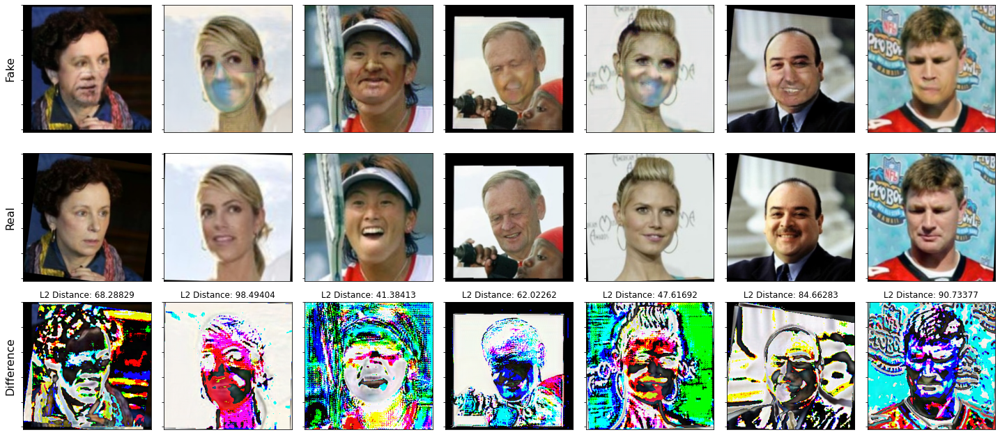

In [667]:
# mask2unmask, unmask2mask
target_dset = unmask2mask
n_samples = 7
random = np.random.randint(low = 1, high = 400, size = n_samples)

vis_diff(mask2unmask_real, unmask2mask_fake, n_samples)

-----------------------------------------------------------------------